In [126]:
from collections import Counter
from os import listdir
from os.path import isfile, join

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [127]:
def getCsiMatrFromCsv(fileName: str, CsiFilesFolder: str) -> pd.DataFrame:
    csvFilePath = join(CsiFilesFolder, fileName)
    return pd.read_csv(csvFilePath)


def upload2Dataset(csi_dict: {str: pd.DataFrame}, csi_cvs_folder: str = "dataset"):
    # fileName == "fileName.csv"
    csi_cvs_folder = csi_cvs_folder

    for fileName in csi_dict:
        csvFileName = fileName[:-3] + "csv"
        csi_dict[fileName].to_csv(join(csi_cvs_folder, csvFileName), index=False)

def getCsiDictFromDataset(dataset_folder: str = "dataset") -> {str: pd.DataFrame}:
    csi_dict: {str: pd.DataFrame} = dict()
    csiFiles = [fileName for fileName in listdir(dataset_folder) if isfile(join(dataset_folder, fileName))]
    for idx, fileName in enumerate(csiFiles):
        csi_matrix = getCsiMatrFromCsv(fileName, dataset_folder)
        # csi_matrix.head(2)
        csi_dict[fileName] = csi_matrix
    return csi_dict

In [128]:
filesLen = pd.DataFrame(columns=["FileName", "FileLen"])
dataset_folder = "dataset"
csiFiles = [fileName for fileName in listdir(dataset_folder) if isfile(join(dataset_folder, fileName))]
csi_dict: {str: pd.DataFrame} = dict()
for idx, fileName in enumerate(csiFiles):
    csi_matrix = getCsiMatrFromCsv(fileName, dataset_folder)
    # csi_matrix.head(2)
    csi_dict[fileName] = csi_matrix
    filesLen.loc[idx] = [fileName, csi_matrix.shape[0]]

### Dot plot of files lengths

In [129]:
binsHeight, intervals = np.histogram(filesLen.FileLen.values, bins=200)

In [130]:
binsHeight

array([ 8, 10,  5,  0,  0,  2,  0,  2,  0,  2,  1,  1,  1,  0,  2,  0,  1,
        0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  1,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,
        1,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1], dtype=int64)

In [131]:
y = []
step = 1
for i in binsHeight:
    for j in range(i):
        y.append((j+1) * step)

filesLen = filesLen.sort_values("FileLen")
filesLen["Count"] = y

In [132]:
filesLen = filesLen.sort_values("FileName")
filesLen

,FileName,FileLen,Count
0,Falldown_1.csv,76,2
1,Falldown_2.csv,69,8
2,Falldown_3.csv,18,4
3,Falldown_4.csv,44,7
4,Falldown_5.csv,17,2
5,Falldown_6.csv,16,1
6,Falldown_7.csv,17,3
7,Hand_circle_1.csv,22,5
8,Hand_circle_2.csv,96,4
9,Hand_circle_3.csv,68,7


In [133]:
actionsType = {"Falldown": "■",
               "Hand_circle": "▲",
               "Hand_move_up": "●",
               "Nothing": "◆",
               "Smoking": "▼",
               "Walking_along": "♥",
               "Walking_perpendicular":"♠"
               }

for idx in filesLen.index.values:
    fileName = filesLen.iloc[idx,0]
    for actT in actionsType.keys():
        if actT in fileName:
            filesLen.iloc[idx,0] = actT

In [134]:
(actionsType.values())

dict_values(['■', '▲', '●', '◆', '▼', '♥', '♠'])

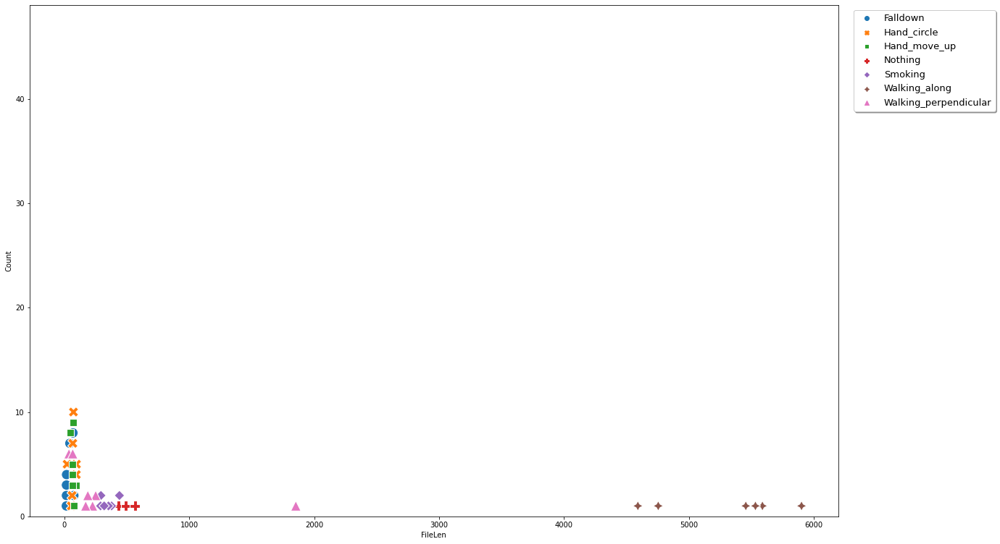

In [153]:
# '■', '▲', '●', '◆', '▼', '♥', '♠'
# "□", "△", "○", "◊", "▽", "☆", "☖"
# signs = []

maxSignsNumb = 0
for actT in actionsType:
    signsNumb = len(list(filter(lambda x: actT in x, filesLen.FileName)))
    if signsNumb > maxSignsNumb:
        maxSignsNumb = signsNumb
    # signs += [actionsType[actT], ] * signsNumb


plt.figure(figsize=(20, 13))
plt.ylim((-0.002, 7*step*maxSignsNumb))
# sns.histplot(data=filesLen, x="FileLen", bins=intervals)
scatter = sns.scatterplot(data=filesLen, x="FileLen", y="Count", hue="FileName", style="FileName", s=200)
scatter.legend(fontsize=13,
               bbox_to_anchor=(1.2, 1),
               shadow=True,
               facecolor='white');
plt.savefig("pictures/dataset_dot-plot.jpg", bbox_inches="tight")

In [136]:
filesLen

,FileName,FileLen,Count
0,Falldown,76,2
1,Falldown,69,8
2,Falldown,18,4
3,Falldown,44,7
4,Falldown,17,2
5,Falldown,16,1
6,Falldown,17,3
7,Hand_circle,22,5
8,Hand_circle,96,4
9,Hand_circle,68,7


### Correlation matrix for first packet of each file

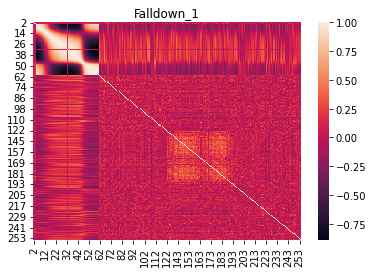

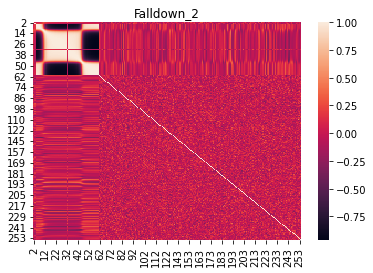

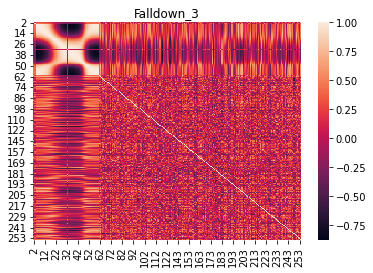

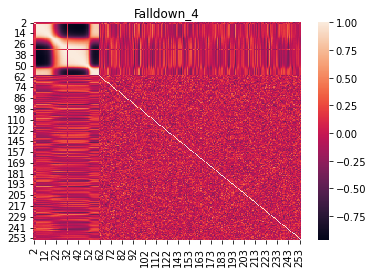

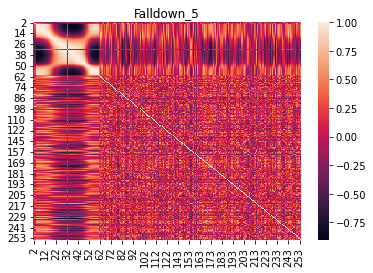

...

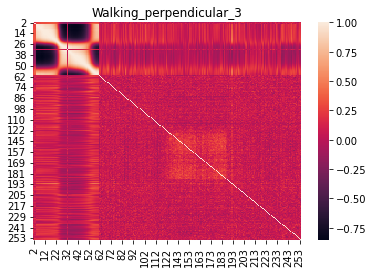

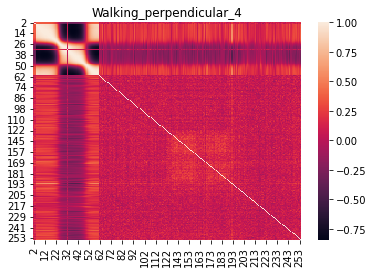

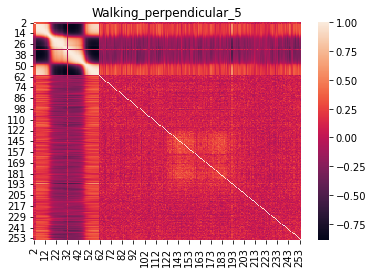

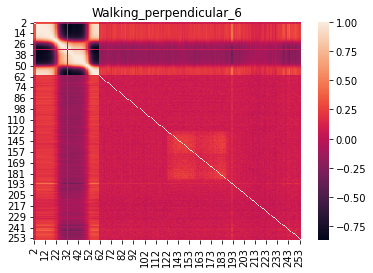

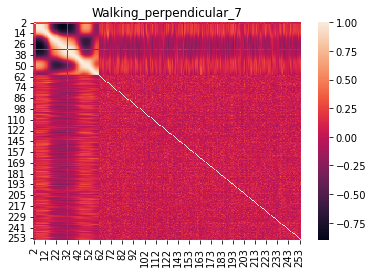

In [137]:
for fileName in csi_dict:
    csi_matrix = csi_dict[fileName]
    packet = csi_matrix.iloc[0]
    plt.title(fileName[:-4])
    sns.heatmap(csi_matrix.corr())
    plt.savefig(f"pictures/files_correlation/dataset_correlation-matrix_{fileName[:-4]}.jpg", bbox_inches="tight")
    plt.show()

### change all NaN and +-inf values in file to median of corresponding packet or delete the packet if those values too much

In [138]:
for fileName in csi_dict:
    csi_matrix = csi_dict[fileName]
    for idx in csi_matrix.index.values:
        packet = csi_matrix.iloc[idx]
        stateMass = (packet == "-inf") | (packet == np.inf) | (packet == -np.inf)
        if stateMass.sum() >= (0.3 * len(packet)):
            csi_dict[fileName] = csi_dict[fileName].drop(index=idx)
        elif stateMass.sum() != 0:
            medianVal = packet.median()
            csi_dict[fileName].iloc[idx][stateMass] = medianVal

#### check if  NaN, +-inf present in files

In [139]:
for fileName in csi_dict:
    csi_matrix = csi_dict[fileName]
    for idx in csi_matrix.index.values:
        packet = csi_matrix.iloc[idx]
        if any((packet == "NaN") | (packet == np.inf) | (packet == -np.inf)):
            print(fileName, idx)

### upload csi_dict to dataset


In [140]:
upload2Dataset(csi_dict)

### file heatmap

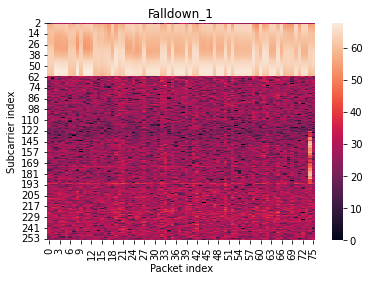

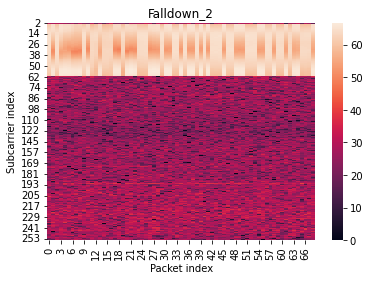

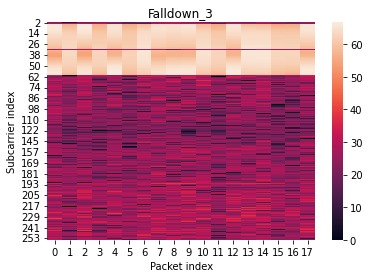

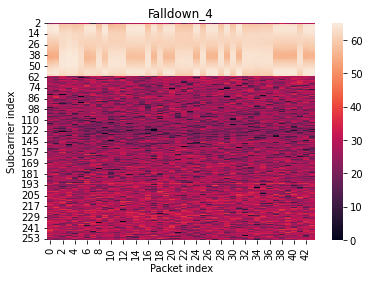

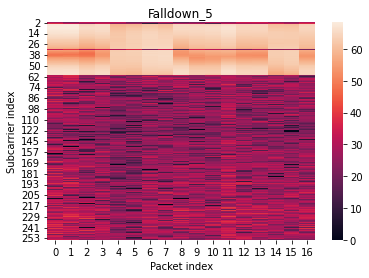

...

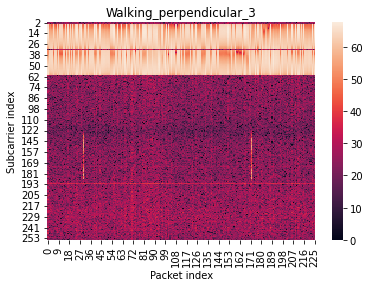

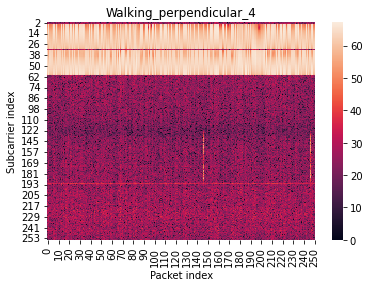

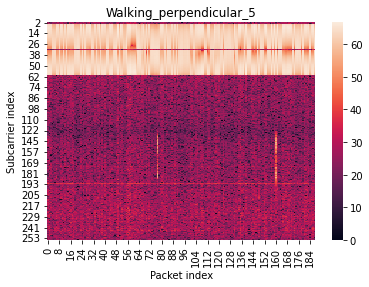

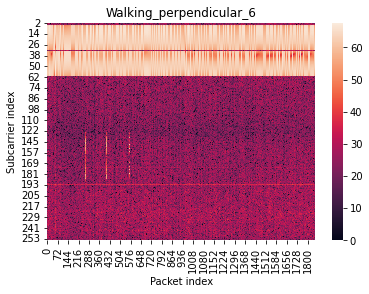

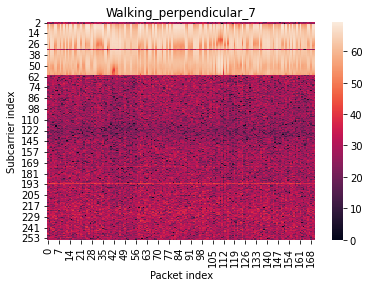

In [141]:
for fileName in csi_dict:
    csi_matrix = csi_dict[fileName]
    plt.title(fileName[:-4])
    sns.heatmap(csi_matrix.T, vmin=0, vmax=csi_matrix.values.max())
    plt.ylabel("Subcarrier index")
    plt.xlabel("Packet index")
    plt.savefig(f"pictures/files_heatmap/dataset_heatmap_{fileName[:-4]}.jpg", bbox_inches="tight")
    plt.show()

### line plot of one(150-th) subcarriers

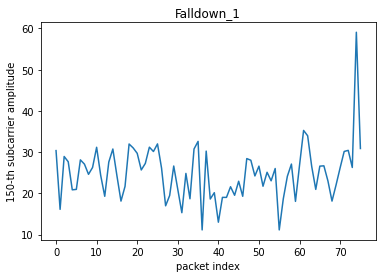

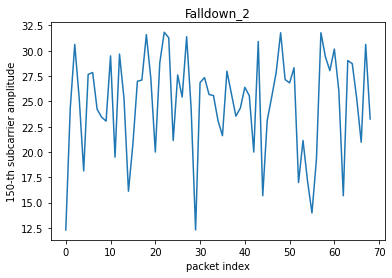

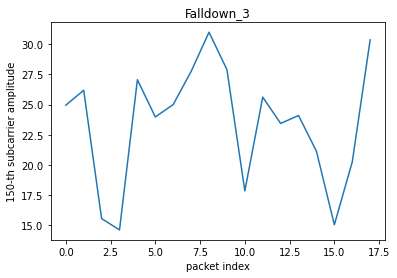

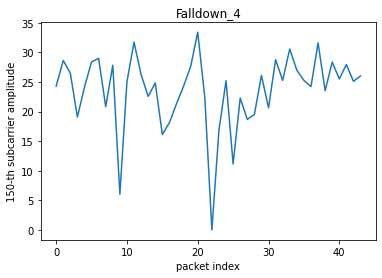

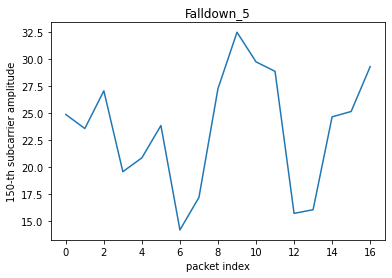

...

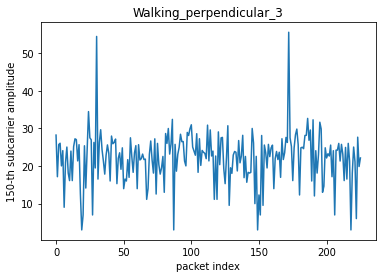

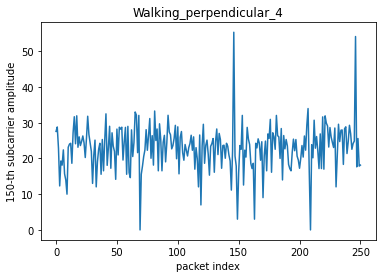

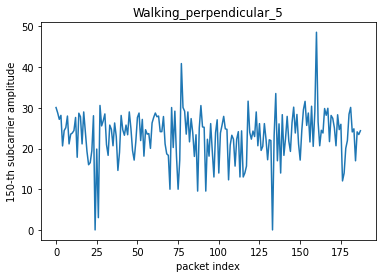

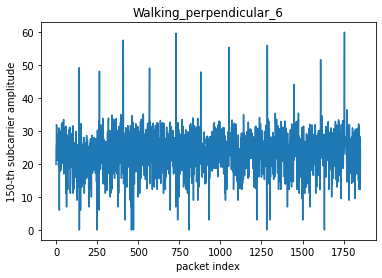

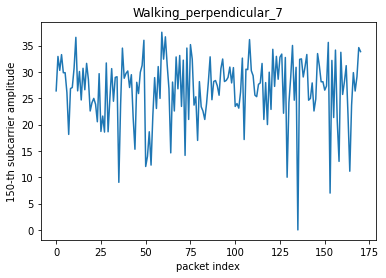

In [142]:
subcarrierIdx = 150
for fileName in csi_dict:
    csi_matrix = csi_dict[fileName]
    csi_matrix[str(subcarrierIdx)].plot.line()
    plt.title(fileName[:-4])
    plt.ylabel(f"{subcarrierIdx}-th subcarrier amplitude")
    plt.xlabel("packet index")
    plt.savefig(f"pictures/files_line-plot_one_subcarrier/dataset_line-plot_{fileName[:-4]}.jpg", bbox_inches="tight")
    plt.show()

### line plot of 10 subcarriers

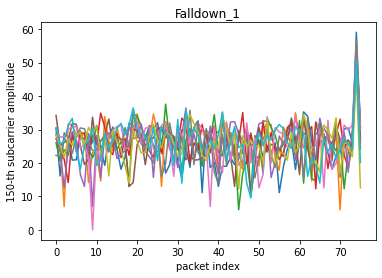

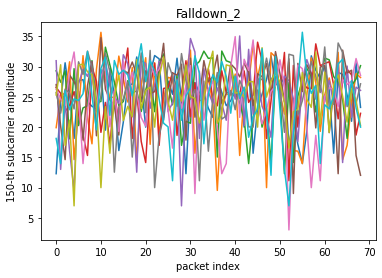

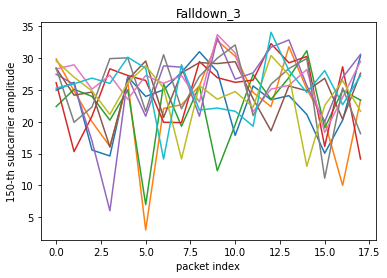

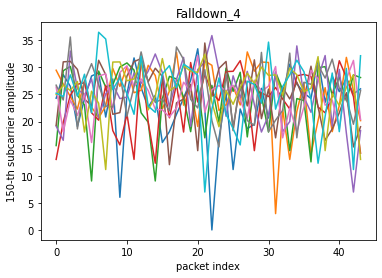

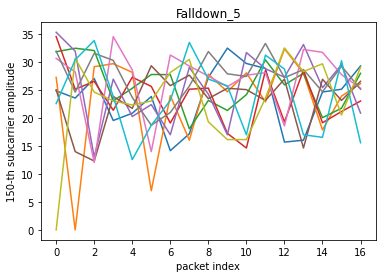

...

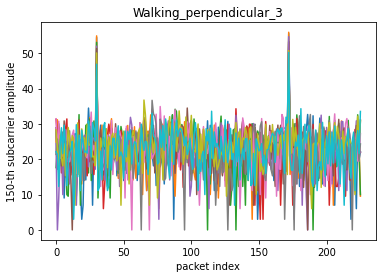

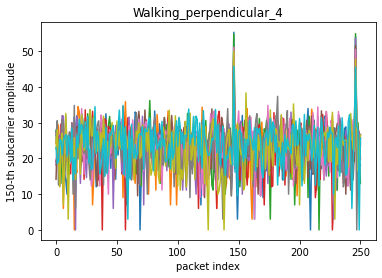

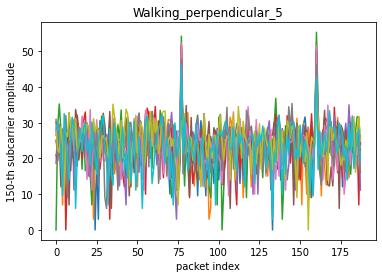

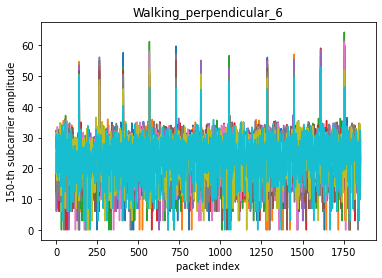

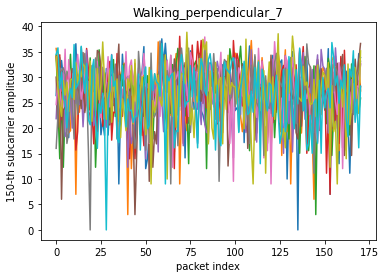

In [143]:
subcarrierIdxs = range(150, 160)
for fileName in csi_dict:
    csi_matrix = csi_dict[fileName]
    for idx in subcarrierIdxs:
        csi_matrix[str(idx)].plot.line()
    plt.title(fileName[:-4])
    plt.ylabel(f"{subcarrierIdx}-th subcarrier amplitude")
    plt.xlabel("packet index")
    plt.savefig(f"pictures/files_line-plot_ten_subcarrier/dataset_line-plot_{fileName[:-4]}.jpg", bbox_inches="tight")
    plt.show()

In [144]:
csi_matrix["2"]

0      30.681859
1      27.067178
2      33.490832
3      19.294189
4      35.020172
         ...    
166    32.052044
167    25.118834
168    27.242759
169    32.097830
170    31.607686
Name: 2, Length: 171, dtype: float64